# **ПРАКТИЧЕСКОЕ ЗАДАНИЕ**
Обучить СНС с помощью Transfer Learning на датасете Food-101.

Использовать тонкую настройку существующей предобученной модели и методы аугментации данных.

Библиотеки: [Python, Tensorflow]

In [ ]:
#!pip install tensorflow-datasets

In [3]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
import tensorflow_datasets as tfds

#### **ЗАГРУЗКА ДАТАСЕТА FOOD101**

In [ ]:
# tfds.disable_progress_bar()
(train_ds, test_ds), ds_info = tfds.load(
    'food101', 
    as_supervised=True,
    with_info=True,
    split=['train[:10%]', 'validation[:10%]'],
)

label_names = ds_info.features['label'].names

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

In [3]:
print(f'Train exemples: {len(train_ds)}')
print(f'Test examples: {len(test_ds)}')
print(f'Labels: {len(label_names)}')

Train exemples: 37875
Test examples: 12625
Labels: 101


#### **ВИЗУАЛИЗАЦИЯ ДАТАСЕТА FOOD101**

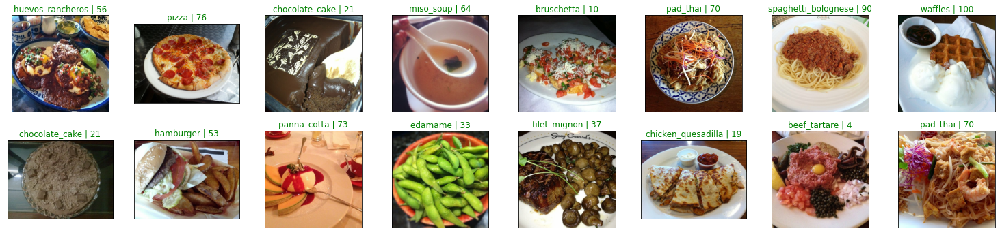

In [ ]:
some_samples = [x[0] for x in iter(train_ds.take(16))]
some_labels = [x[1].numpy() for x in iter(train_ds.take(16))]

fig = plt.figure(figsize=(26, 12))
for j in range(len(some_samples)):
    ax = fig.add_subplot(4, 8, j + 1)
    ax.imshow(some_samples[j])
    ax.set_title(label_names[some_labels[j]] + ' | ' + str(some_labels[j]), c='green')
    plt.xticks([]), plt.yticks([])
plt.show()

In [ ]:
# высота изображений не везде 512
for i in some_samples[:10]:
  print(i.shape)

(512, 512, 3)
(384, 512, 3)
(512, 512, 3)
(512, 512, 3)
(512, 512, 3)
(512, 512, 3)
(512, 512, 3)
(512, 512, 3)
(384, 512, 3)
(384, 512, 3)


In [ ]:
# узнаем минимальные ширину и высоту изображений
img_w = set()
img_h = set()
for item in train_ds:
  if item[0].shape[0] != 512:
    img_w.add(item[0].shape[0])
  elif item[0].shape[1] != 512:
    img_h.add(item[0].shape[1])
print(f'Min width: {min(img_w)}\nMin height: {min(img_h)}')

Min width: 122
Min height: 193


#### **СОЗДАНИЕ ПАЙПЛАПЙНА ДАННЫХ**

In [ ]:
INP_SIZE = 224
NUM_EPOCHS = 5
BATCH_SIZE = 32
AUTOTUNE = tf.data.AUTOTUNE
BUFFER_SIZE = 1000


def resize_images(img, label):
    img = tf.cast(img, tf.float32) / 127. - 1.  # значения от -1 до 1, модель MobileNetV2 ожидает такие данные
    return tf.image.resize(img, (INP_SIZE, INP_SIZE)), label


def augment(image_label, seed):
  image, label = image_label
  new_seed = tf.random.experimental.stateless_split(seed, num=1)[0, :]  
  image = tf.image.stateless_random_brightness(image, max_delta=0.3, seed=new_seed)  # случайная яркость
  image = tf.image.stateless_random_flip_left_right(image, seed=new_seed)  # случайное отражение
  image = tf.image.stateless_random_hue(image, max_delta=0.25, seed=new_seed)  # случайный тон
  image = tf.clip_by_value(image, 0, 1)
  return image, label


if 0:
    # применение аугментации
    counter = tf.data.experimental.Counter()
    tf.config.run_functions_eagerly(True)
    train_ds = tf.data.Dataset.zip((train_ds, (counter, counter)))
    train_ds = train_ds.map(augment, num_parallel_calls=AUTOTUNE)

# общая обработка датасета
train_ds = train_ds.shuffle(buffer_size=BUFFER_SIZE)
train_ds = train_ds.map(resize_images, num_parallel_calls=AUTOTUNE)
train_ds = train_ds.batch(BATCH_SIZE, drop_remainder=True)

test_ds = test_ds.shuffle(buffer_size=BUFFER_SIZE)
test_ds = test_ds.map(resize_images, num_parallel_calls=AUTOTUNE)
test_ds = test_ds.batch(128, drop_remainder=True)

#### **ПОДГОТОВКА МОДЕЛИ CNN**

In [ ]:
if 0: # Обучение модели MobileNetV2

    # EXP_NAME = 'MobileNetV2'
    # EXP_NAME = 'MobileNetV2_augmentaion'
    EXP_NAME = 'MobileNetV2_trainable_false'
    base_model = tf.keras.applications.MobileNetV2(
        input_shape=(INP_SIZE, INP_SIZE, 3),
        include_top=False,
        weights='imagenet',  # предобученные веса
    )
    # base_model.trainable = True  # Fine-tuning весов предобученной модели
    base_model.trainable = False  # Заморозка весов предобученной модели

if 1: # Обучение модели EfficientNetV2S

    EXP_NAME = 'EfficientNetV2S'
    base_model = tf.keras.applications.EfficientNetV2S(
        input_shape=(INP_SIZE, INP_SIZE, 3),
        include_top=False,
        weights='imagenet',
        include_preprocessing=False,
    )
    base_model.trainable = True  # Fine-tuning весов предобученной модели
    # base_model.trainable = False  # Заморозка весов предобученной модели

model = tf.keras.Sequential([
    base_model,
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dense(101, activation='softmax'),
])

82420632/82420632 [==============================] - 0s 0us/step


#### **ПОДГОТОВКА К ОБУЧЕНИЮ**

In [ ]:
LEARNING_RATE = 0.0001
OPTIMISER = tf.keras.optimizers.Adam(learning_rate=LEARNING_RATE)

model.compile(optimizer=OPTIMISER,
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

tensorboard_callback = tf.keras.callbacks.TensorBoard(
    log_dir='logs/' + EXP_NAME, 
    write_graph=False, update_freq=100, profile_batch=0)

#### **MODEL SUMMARY**

In [ ]:
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnetv2-s (Functiona  (None, 7, 7, 1280)       20331360  
 l)                                                              
                                                                 
 global_average_pooling2d_3   (None, 1280)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dense_3 (Dense)             (None, 101)               129381    
                                                                 
Total params: 20,460,741
Trainable params: 20,306,869
Non-trainable params: 153,872
_________________________________________________________________


#### **ОБУЧЕНИЕ МОДЕЛИ**

In [ ]:
%%time

history = model.fit(
    train_ds,
    epochs=NUM_EPOCHS,
    validation_data=test_ds,
    callbacks=[tensorboard_callback])

Epoch 1/5
1183/1183 [==============================] - 942s 794ms/step - loss: 2.3358 - accuracy: 0.4721 - val_loss: 0.9574 - val_accuracy: 0.7512
Epoch 2/5
1183/1183 [==============================] - 946s 799ms/step - loss: 0.9671 - accuracy: 0.7499 - val_loss: 0.7327 - val_accuracy: 0.8001
Epoch 3/5
1183/1183 [==============================] - 974s 823ms/step - loss: 0.5513 - accuracy: 0.8527 - val_loss: 0.7042 - val_accuracy: 0.8082
Epoch 4/5
1183/1183 [==============================] - 936s 790ms/step - loss: 0.3209 - accuracy: 0.9126 - val_loss: 0.7205 - val_accuracy: 0.8111
Epoch 5/5
1183/1183 [==============================] - 937s 791ms/step - loss: 0.2034 - accuracy: 0.9434 - val_loss: 0.7523 - val_accuracy: 0.8119
CPU times: user 1h 18min 38s, sys: 1min 21s, total: 1h 19min 59s
Wall time: 1h 20min 16s


#### **ОЦЕНКА КАЧЕСТВА МОДЕЛИ**

In [ ]:
history_test = model.evaluate(test_ds)
history_test

98/98 [==============================] - 50s 495ms/step - loss: 0.7499 - accuracy: 0.8126


[0.7498509883880615, 0.8125796914100647]

In [ ]:
# сохраним историю экспериментов
import pickle

# models_dict = {'models': {'name': [], 'train_history': [], 'test_history': []}}
# models_dict['models']['name'].append('MobileNetV2')
# models_dict['models']['name'].append('MobileNetV2_augmentaion')
# models_dict['models']['name'].append('MobileNetV2_trainable_false')
# models_dict['models']['name'].append('EfficientNetV2S')
# models_dict['models']['train_history'].append(history.history)
# models_dict['models']['test_history'].append(history_test)

# with open('history_models_1_2_3_4.pkl', 'wb') as f:
#   pickle.dump(models_dict, f)
with open('history_models_1_2_3_4.pkl', 'rb') as f:
  new_dict = pickle.load(f)
# print(new_dict)

In [ ]:
# # сохраним итоговую модель
# !mkdir -p saved_model
# model.save('saved_model/my_model')

#### **TENSORBOARD**

In [ ]:
%load_ext tensorboard
%tensorboard --logdir logs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 57504), started 1:45:42 ago. (Use '!kill 57504' to kill it.)

<IPython.core.display.Javascript object>

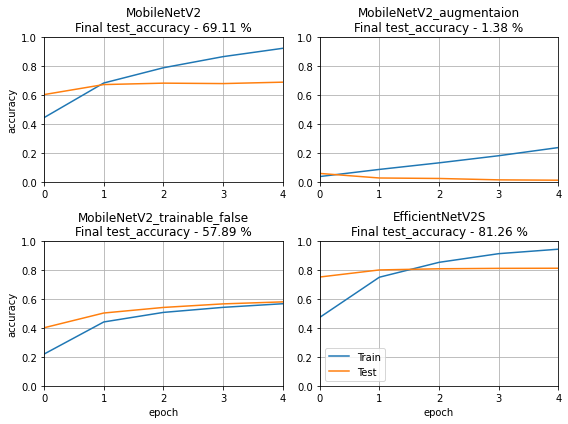

In [175]:
# вместо tensorboard

fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(8, 6))

axs[0, 0].plot(new_dict['models']['train_history'][0]['accuracy'], label='Train')
axs[0, 0].plot(new_dict['models']['train_history'][0]['val_accuracy'], label='Test')
axs[0, 0].set_title(new_dict['models']['name'][0] + '\nFinal test_accuracy - ' + str(round(new_dict['models']['test_history'][0][1]*100, 2)) + ' %')
axs[0, 0].grid(True)
axs[0, 0].set_xlim(0, 4)
axs[0, 0].set_ylim(0, 1)
axs[0, 0].set_ylabel('accuracy')

axs[0, 1].plot(new_dict['models']['train_history'][1]['accuracy'], label='Train')
axs[0, 1].plot(new_dict['models']['train_history'][1]['val_accuracy'], label='Test')
axs[0, 1].set_title(new_dict['models']['name'][1] + '\nFinal test_accuracy - ' + str(round(new_dict['models']['test_history'][1][1]*100, 2)) + ' %')
axs[0, 1].grid(True)
axs[0, 1].set_xlim(0, 4)
axs[0, 1].set_ylim(0, 1)

axs[1, 0].plot(new_dict['models']['train_history'][2]['accuracy'], label='Train')
axs[1, 0].plot(new_dict['models']['train_history'][2]['val_accuracy'], label='Test')
axs[1, 0].set_title(new_dict['models']['name'][2] + '\nFinal test_accuracy - ' + str(round(new_dict['models']['test_history'][2][1]*100, 2)) + ' %')
axs[1, 0].grid(True)
axs[1, 0].set_xlim(0, 4)
axs[1, 0].set_ylim(0, 1)
axs[1, 0].set_xlabel('epoch')
axs[1, 0].set_ylabel('accuracy')

axs[1, 1].plot(new_dict['models']['train_history'][3]['accuracy'], label='Train')
axs[1, 1].plot(new_dict['models']['train_history'][3]['val_accuracy'], label='Test')
axs[1, 1].set_title(new_dict['models']['name'][3] + '\nFinal test_accuracy - ' + str(round(new_dict['models']['test_history'][3][1]*100, 2)) + ' %')
axs[1, 1].grid(True)
axs[1, 1].set_ylim(0, 1)
axs[1, 1].set_xlim(0, 4)
axs[1, 1].set_xlabel('epoch')

fig.tight_layout()
plt.legend()

plt.show()

**ВЫВОД:**

Было проведено 4 эксперимента:
1. модель **MobileNetV2** с предобученными весами 'Imagenet'
2. модель **MobileNetV2** с предобученными весами 'Imagenet' + **аугментация данных**
3. модель **MobileNetV2** с предобученными весами 'Imagenet' + **тренировка только слоя-классификатора**
4. модель **EfficientNetV2S** с предобученными весами 'Imagenet'

Обучение проводилось на **5-ти эпохах** на половине датасета **'food101'**.

**Лучше всего отработала модель №4**, точность составила на тестовой выборке - **81.26 %**.

Хуже всего обучалась модель №2 с аугментацией данных, как по скорости, так и по качеству. Пять эпох для обучения явно недостаточно. Возможно стоит дополнительно отрегулировать параметры самой аугментации.

Также интересно посмотреть на поведение моделей №1 и №3 на большем количестве эпох. Возможно точность увеличится, хотя модель №1 вероятно уже идет по пути переобучения.

#### **ПРЕДСКАЗАНИЕ НА СЛУЧАЙНОЙ КАРТИНКЕ ИЗ ИНТЕРНЕТА**

--2023-01-18 20:35:53--  http://2.bp.blogspot.com/-J0Vcs9F784o/UftuvDLCkjI/AAAAAAAAAUc/k98iv88segk/s1600/%D0%BD%D0%B0%D1%86%D0%B8%D0%BE%D0%BD%D0%B0%D0%BB%D1%8C%D0%BD%D0%B0%D1%8F+%D0%B5%D0%B4%D0%B0+%D0%98%D1%82%D0%B0%D0%BB%D0%B8%D0%B8.jpg
Resolving 2.bp.blogspot.com (2.bp.blogspot.com)... 108.177.126.132, 2a00:1450:4013:c01::84
Connecting to 2.bp.blogspot.com (2.bp.blogspot.com)|108.177.126.132|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 406244 (397K) [image/jpeg]
Saving to: ‘национальная+еда+Италии.jpg.1’

национальная+еда+Ит 100%[===================>] 396.72K  --.-KB/s    in 0.002s  

2023-01-18 20:35:53 (162 MB/s) - ‘национальная+еда+Италии.jpg.1’ saved [406244/406244]



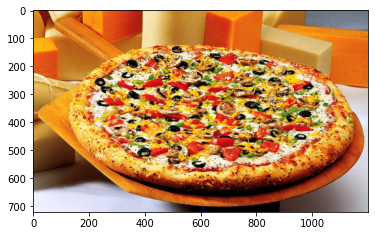

In [52]:
import imageio
from skimage.transform import resize

def prepare_image(img):
    img = img.astype(np.float32)/127. - 1.
    img = resize(img, (INP_SIZE, INP_SIZE), order=3, mode='reflect', anti_aliasing=True)
    return img.astype(np.float32)

if 1:
    !wget http://2.bp.blogspot.com/-J0Vcs9F784o/UftuvDLCkjI/AAAAAAAAAUc/k98iv88segk/s1600/%D0%BD%D0%B0%D1%86%D0%B8%D0%BE%D0%BD%D0%B0%D0%BB%D1%8C%D0%BD%D0%B0%D1%8F+%D0%B5%D0%B4%D0%B0+%D0%98%D1%82%D0%B0%D0%BB%D0%B8%D0%B8.jpg

img = imageio.imread('/content/национальная+еда+Италии.jpg', pilmode="RGB")
plt.imshow(img)
img = prepare_image(img)

In [ ]:
pred = model(img[None, ...], training=False)

pred_label = label_names[np.argmax(pred)]
print(f'Prediction: {pred_label}')

Prediction: pizza


#### **ПРЕДСКАЗАНИЯ НА ИЗОБРАЖЕНИЯХ ИЗ ТЕСТОВОЙ ВЫБОРКИ**

In [ ]:
# загрузим модель
new_model = tf.keras.models.load_model('saved_model/my_model')

# загрузим датасет без обработки
new_train_ds, new_test_ds = tfds.load(
    'food101', 
    as_supervised=True,
    with_info=False,
    split=['train[:50%]', 'validation[:50%]'],
)

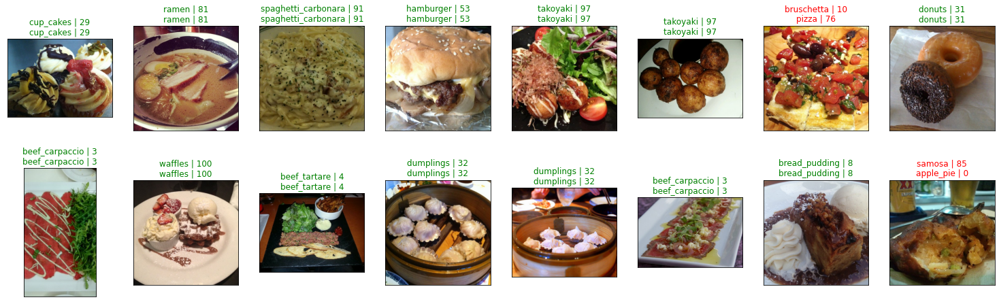

In [84]:
# сделаем предсказания и визуализируем

some_samples_test = [x[0] for x in iter(new_test_ds.take(16))]
some_labels_test = [x[1].numpy() for x in iter(new_test_ds.take(16))]

fig = plt.figure(figsize=(26, 16))
for j in range(len(some_samples_test)):

    item = prepare_image(np.array(some_samples_test[j]))
    preds = new_model(item[None, ...], training=False)
    preds = np.argmax(preds)

    ax = fig.add_subplot(4, 8, j + 1)
    ax.imshow(some_samples_test[j])
    if some_labels_test[j] != preds:
      clr = 'red'
    else:
      clr = 'green'
    ax.set_title(label_names[some_labels_test[j]] + ' | ' + str(some_labels_test[j]) + '\n' + label_names[preds] + ' | ' + str(preds), c=clr)
    plt.xticks([]), plt.yticks([])

plt.show()